# Clasificador de eclipses solares

Juan Camilo Gonzalez Burgos - Juan Sebastian Parra Quintero - Sebastian Pino Sánchez

Basado en el dataset de kaggle [Solar and Lunar Eclipses](https://www.kaggle.com/nasa/solar-eclipses) publicado por la NASA.

Un eclipse solar se presenta cuando desde la tierra, la luna se antepone al sol generando este fenómeno astronómico, igualmente debe ocurrir una alineación entre la tierra, la luna (llena) y el sol. Los tipos de eclipses son:

- **Totales:** Suceden cuando la luz solar es ocultada completamente por la luna.
- **Parcial:** Suceden cuando la luna no llega a ocultar por completo la luz solar y puede llegar a percibirse desde la Tierra como una media luna brillante.
- **Anular:** Suceden cuando la luna oculta el centro del sol y deja ver ligeramente un anillo de luz.

![image.png](./resources/tipos.png)

## Estadística descriptiva

La estadística descriptiva es una disciplina que se encarga de recoger, almacenar, ordenar, realizar tablas o gráficos y calcular parámetros básicos sobre el conjunto de datos. Particularmente para este caso, se pretende utilizar esta disciplina con la finalidad de analizar todas las variables proporcionadas por la NASA para un eclipse y ajustar el conjunto de datos, antes de iniciar con el problema de inferencia.

### Variables

A continuación de da un pequeña descripción de todas las variables del conjunto de datos proporcionado:

- **Catalog Number:** Es un identificador

- **Calendar date:** Fecha del evento, *Tipo de dato -> [Categórica]*

- **Eclipse Time:** Hora del evento. *Tipo de dato -> [Numerica]*

- **Delta T(s):** Es la diferencia de tiempo obtenida al restar el Tiempo Universal del Tiempo Terrestre. *Tipo de dato -> [Numerica]*

- **Lunation number:** El Número de Lunación es el número de meses sinódicos desde la Luna Nueva de 2000 Ene 06. *Tipo de dato -> [Numerica]*

- **Saros number:** Es un periodo de tiempo de 223 lunas (meses sinódicos), lo que equivale a 6585.32 días. *Tipo de dato -> [Numérica]*

- **Eclypse Type:** Tipos de eclipses solares. *Tipo de dato -> [Categorica]*
    
    - P = Eclipse Parcial.
    - A = Eclipse anular.
    - T = Eclipse total.
    - H = Eclipse híbrido o anular/total.

    Segundo carácter del Tipo de Eclipse:
    - "m" = Eclipse central de la serie Saros.
    - "n" = Eclipse central sin límite norte.
    - "s" = Eclipse central sin límite sur.
    - "+" = Eclipse no central sin límite norte.
    - "-" = Eclipse no central sin límite sur.
    - "2" = La trayectoria híbrida comienza total y termina anular.
    - "3" = La trayectoria híbrida comienza anular y termina total.
    - "b" = Comienza la serie Saros (primer eclipse de la serie).
    - "e" = La serie Saros termina (último eclipse de la serie).
   
- **Gamma:** De un eclipse describe la centralidad con la que la sombra de la Luna o de la Tierra incide sobre el otro cuerpo. *Tipo de dato -> [Numérica]*

- **Eclipse Magnitude:** Es la fracción del diámetro angular de un cuerpo celeste que se eclipse. *Tipo de dato -> [Numérica]*

- **Latitude:** Es la distancia angular entre la línea ecuatorial (el ecuador). *Tipo de dato -> [Numerica]*

- **Longitude:** Es un concepto métrico definible para entidades geométricas sobre las que se ha definido una distancia. *Tipo de dato -> [Numerica]*

- **Sun Altitude:** Es el ángulo del sol en relación con el horizonte de la Tierra, y se mide en grados. La altitud es nula al amanecer y al atardecer, y puede alcanzar un máximo de 90 grados (directamente por encima) al mediodía en latitudes cercanas al ecuador. *Tipo de dato -> [Numerica]*

- **Sun Azimuth:** Es el ángulo entre la proyección del centro del sol sobre el plano horizontal y la dirección sur. *Tipo de dato -> [Numerica]*

- **Path Width (km):** Anchura de la trayectoria de la totalidad. *Tipo de dato -> [Numérica]*

- **Central Duration:** Tiempo que dura el eclipse en el centro del otro cuerpo. *Tipo de dato -> [Numérica]*

![image.png](./resources/download.png)

In [1]:
# Se instalan las librerias requeridas en el ambiente local
!pip install -r ./requirements.txt

You should consider upgrading via the '/home/sebastian/Documentos/ML-Trabajo-final/ml_unal/bin/python -m pip install --upgrade pip' command.


In [2]:
# Importe de librerias requeridas
from datetime import datetime
from plotly.subplots import make_subplots
from scipy import stats
from sklearn import linear_model
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns

## Funciones de tipo ETL para la transformación de las variables del dataset

Los procesos ETL (Extract, Transform, Load) se aplican con los siguientes objetivos:

1. **Extract:** Obtener el conjunto de datos de la fuente de origen.
2. **Transform:** Organizar los datos de la fuente de origen a un formato que esté en concordancia con nuestra arquitectura.
3. **Load:** Llevar los datos trasformados a un punto en común para otros procesos de analítica.

Particularmente para este problema, únicamente utilizamos los procesos de transformación y de carga.

In [3]:
"""
Convierte la longitud a grados entre [-180°,180°] 
"""
def convert_longitude_to_numerical(longitude):
    degrees = longitude[:-1]
    word = longitude[-1]
    degrees = float(degrees)
    if word == "W":
        return degrees*-1
    return degrees

In [4]:
"""
Convierte la latitud a grados entre [-180°,180°] 
"""
def convert_latitude_to_numerical(latitude):
    degrees = latitude[:-1]
    word = latitude[-1]
    degrees = float(degrees)
    if word == "S":
        return degrees*-1
    return degrees

In [5]:
"""
Convertir la variable duración central a segundos
"""
def convert_central_duration_to_seconds(central_duration):
    if type(central_duration) == float or central_duration == "-":
        return 0
        #return None
    minutes_index = central_duration.index("m")
    minutes = int(central_duration[:minutes_index])
    return (minutes*60) + int(central_duration[minutes_index + 1:-1])

In [6]:
"""
Convertir la variable path width a número o None
"""
def fix_path_width(path_width):
    if path_width == None:
        #return None
        return 0
    elif path_width == "-":
        #return None
        return 0
    return float(path_width)

In [7]:
"""
Transforma una fecha del formato 1999 June 12 al formato YYYY:MM:DD
"""
def transform_data_month(string_date):
    date_split = string_date.split()
    month_number = dic_months[date_split[1]]
    return date_split[0]+':'+str(month_number)+':'+date_split[2]

In [8]:
"""
Transforma una fecha del formato YYYY:MM:DD y una hora en el formato hh:mm:ss a YYYY:MM:DD:hh:mm:ss
"""
def date_time(string_date, string_time):
    return string_date + ':' + string_time

In [9]:
"""
Transforma una fecha del formato YYYY:MM:DD:hh:mm:ss a una lista de la forma [YYYY, MM, DD, hh, mm, ss]
"""
def datetime_to_list(string_date_time):    
    date_list = string_date_time.split(':')
    date_list = [int(i) for i in date_list]
    return date_list

In [10]:
"""
Tranforma un entero entre 0 y 99 en un string de 2 digitos
"""
def mak_2_dig(x):
    return "{:02d}".format(x)

In [11]:
"""
Tranforma una Datetime en calendario Juliano o Gregoriano al número de días en calendario Juliano
"""
def date_to_jd(datetime):
    # Se obtiene una listada de la forma [YYYY, MM, DD, hh, mm, ss]
    date_list = datetime_to_list(datetime)
    
    # Se destructuran los valores del datetime
    y, mo, d, h, mn, s = date_list
    
    # Se valida si la fecha está en calendario Gregoriano
    if date_list[:3] >= [1582,10,15]:
        # Formula para el calculo de días en el calendario Juliano de una fecha en calendario Gregoriano
        return 367*y - (7*(y+int((mo+9)/12)))//4 - (3*(int((y+(mo-9)/7)/100)+1))//4+(275*mo)//9+d+1721028.5+h/24+mn/(24*60)+s/86400
    
    # Se tiene en cuenta los 10 días del desfase entre los calendarios
    elif date_list[:3] <= [1582,10,4]:
        # Formula para el calculo de días en el calendario Juliano de una fecha
        return 367*y - (7*(y+5001+int((mo-9)/7)))//4+(275*mo)//9+d+1729776.5+h/24+mn/(24*60)+s/86400

In [12]:
"""
Transforma el número de días en calendario Juliano a una fecha
"""
def jd_to_date(jd):
    Z = int(jd+0.5)
    F = (jd+0.5)%1
    if Z < 2299161:
        A = Z
    else:
        g = int((Z - 1867216.25) / 36524.25)
        A = Z + 1 + g - g//4 

    B = A + 1524
    C = int((B-122.1) / 365.25)
    D = int(365.25 * C)
    E = int((B-D) / 30.6001)
    
    # Cálculo del día
    d = B - D - int(30.6001*E) + F
    
    # Cálculo del mes
    if E<14:
        mo = E-1
    else:
        mo = E-13    
    
    # Cálculo del año
    if mo >2:
        y = C- 4716
    else:
        y = C - 4715
    
    return str(y)+'-'+mak_2_dig(mo)+'-'+mak_2_dig(int(d))

In [13]:
"""
Medidas de tendencial central y dispersión de una variables
"""
def get_measures(data, column,print_results=False):
    average = data[column].mean()
    median = data[column].median()
    standard_deviation = data[column].std()
    min_value = data[column].min()
    max_value = data[column].max()
    skewness = data[column].skew(axis = 0)
    kurt = data[column].kurt(axis = 0)
    if print_results:
        print(f"Valor mínimo: {min_value}")
        print(f"Promedio: {average}")
        print(f"Mediana: {average}")
        print(f"Valor máximo: {max_value}")
        print(f"Desviación estandar: {average}")
        print(f"Asimetría: {skewness}")
        print(f"Curtosis: {kurt}")
    return average, median, standard_deviation


In [14]:
"""
Graficos para la estadistica descriptiva
"""
def plot_graphs(data, column):
    fig = make_subplots(rows=1, cols=2, specs=[[{"type": "box"}, {"type": "histogram"}]])

    fig.add_trace(go.Box(y=data[column], name = column), row=1, col=1)
    fig.add_trace(go.Histogram(x=data[column], name = column), row=1, col=2)

    fig.update_layout(height=350, width=850, title_text=column)

    fig.show()

In [15]:
"""
Cálculo de métricas de desempeño en la regresión
"""
def metrics(y, y_pred):
    r2 = r2_score(y, y_pred)
    mse = mean_squared_error(y, y_pred)
    
    print('Métricas de desempeño')
    print('R cuadrado',r2)
    print('MSE',mse)

In [16]:
# Se define el path con el dataset de entrada
path = './data'

In [17]:
# Se define el nombre del dataframe con los datos para eclipses solares reportados por la NASA
solar = pd.read_csv(path + '/solar.csv')

In [18]:
# Visualización rápida de las variables del dataframe
solar.head(5)

,Catalog Number,Calendar Date,Eclipse Time,Delta T (s),Lunation Number,Saros Number,Eclipse Type,Gamma,Eclipse Magnitude,Latitude,Longitude,Sun Altitude,Sun Azimuth,Path Width (km),Central Duration
0,1,-1999 June 12,03:14:51,46438,-49456,5,T,-0.2701,1.0733,6.0N,33.3W,74,344,247,06m37s
1,2,-1999 December 5,23:45:23,46426,-49450,10,A,-0.2317,0.9382,32.9S,10.8E,76,21,236,06m44s
2,3,-1998 June 1,18:09:16,46415,-49444,15,T,0.4994,1.0284,46.2N,83.4E,60,151,111,02m15s
3,4,-1998 November 25,05:57:03,46403,-49438,20,A,-0.9045,0.9806,67.8S,143.8W,25,74,162,01m14s
4,5,-1997 April 22,13:19:56,46393,-49433,-13,P,-1.4670,0.1611,60.6S,106.4W,0,281,NaN,NaN


## Limpieza de datos

Teniendo en cuenta las variables anteriormente listadas, se procesarán las siguientes:

- Longitud
- Latitud
- Central Duration
- Path Width (km)
- Calendar Date
- Eclipse Time
- Catalog Number

In [19]:
# Se elimina la columna Catalog Number por lo que es un identificador que no aporta información al dataset
solar.drop(['Catalog Number'], axis=1, inplace=True)

In [20]:
# Conversión a grados
solar['Longitude'] = solar['Longitude'].apply(lambda longitud: convert_longitude_to_numerical(longitud))
solar['Latitude'] = solar['Latitude'].apply(lambda latitude: convert_latitude_to_numerical(latitude))

# Conversión a segundos
solar['Central Duration'] = solar['Central Duration'].apply(lambda time: convert_central_duration_to_seconds(time))

# Transformación de datos faltantes
solar['Path Width (km)'] = solar['Path Width (km)'].apply(lambda path_width: fix_path_width(path_width))

solar['Path Width (km)'] = solar['Path Width (km)'].fillna(0)

## **Transformación de fechas**

El objetivo de la tranformación de las fechas, es llevar todas estas a un formato en común (días transcurridos en el calendario Juliano) evitado tener dos tipos de formatos (Gregoriano, Juliano). También, se pretente que la función de transformación tenga como conjunto de llegada un valor numérico ordenado y no un conjunto de datos categóricos.

![image.png](./resources/diagramaF.png)

In [21]:
# Diccionario para convertir un mes a número
dic_months = {
    'January':1,
    'February': 2,
    'March':3,
    'April':4,
    'May':5,
    'June': 6,
    'July':7,
    'August':8,
    'September':9,
    'October':10,
    'November':11,
    'December':12
}

In [22]:
# Transformamos las fechas
solar['Date Transformed'] = solar['Calendar Date'].apply(lambda x:transform_data_month(x))

#Concatenamos la fecha y la hora
solar['Datetime'] = solar.loc[:, ['Date Transformed', 'Eclipse Time']].apply(lambda x: date_time(x[0], x[1]), axis = 1)

#Calculamos la cantidad de días en calendario  Juliano
solar['Time JD'] = solar['Datetime'].apply(lambda x:date_to_jd(x))

# Eliminamos las columnas auxiliares utilizadas para la transformación de la fecha
solar.drop(['Date Transformed', 'Datetime', 'Calendar Date', 'Eclipse Time'], axis=1, inplace=True)

In [23]:
solar.head(5)

,Delta T (s),Lunation Number,Saros Number,Eclipse Type,Gamma,Eclipse Magnitude,Latitude,Longitude,Sun Altitude,Sun Azimuth,Path Width (km),Central Duration,Time JD
0,46438,-49456,5,T,-0.2701,1.0733,6.0,-33.3,74,344,247.0,397,991085.635313
1,46426,-49450,10,A,-0.2317,0.9382,-32.9,10.8,76,21,236.0,404,991262.489850
2,46415,-49444,15,T,0.4994,1.0284,46.2,83.4,60,151,111.0,135,991440.256435
3,46403,-49438,20,A,-0.9045,0.9806,-67.8,-143.8,25,74,162.0,74,991616.747951
4,46393,-49433,-13,P,-1.4670,0.1611,-60.6,-106.4,0,281,0.0,0,991765.055509


In [24]:
# Guardamos los datos limpios en un nuevo CSV
solar.to_csv(path + "/solar_clean.csv", index=False)

### Estadística descriptiva variables numéricas

Las variables númericas son las siguientes

- Delta T (s)
- Lunation Number
- Saros Number
- Gamma
- Eclipse Magnitude
- Latitude
- Longitude
- Sun Altitude
- Sun Azimuth
- Path Width (km)
- Central Duration

**Delta T(s)**

In [25]:
get_measures(solar, "Delta T (s)", print_results=True)
plot_graphs(solar, "Delta T (s)")

Valor mínimo: -6
Promedio: 12142.172802151623
Mediana: 12142.172802151623
Valor máximo: 46438
Desviación estandar: 12142.172802151623
Asimetría: 1.0009616201574247
Curtosis: -0.2870084750684221


**Delta T(s):** Es la diferencia de tiempo obtenida al restar el Tiempo Universal del Tiempo Terrestre. Tipo de dato -> [Numérica]

Podemos notar que la mayor cantidad de los datos se encuentran cerca de 0 por el valor de la Asimetría que es mayor a 0 (1.0009616201574247) y por la curtosis podemos notar que la mayor cantidad de valores están cerca de la mediana y esto lo podemos evidenciar también por el diagrama de cajas. lo que nos dice que que los eclipses se presentan más que todo cuando el tiempo universal está cerca del tiempo terrestre

In [26]:
fig = px.box(solar, x="Eclipse Type", y="Delta T (s)")
fig.show()

Según la anterior gráfica podemos notar que varios de los diferentes tipos de eclipses tienen un comportamiento similar independiente del valor de Delta, lo que nos hace creer que el valor de Delta no afecta el tipo de eclipse exceptuando algunos casos como lo es el A+ (Eclipse anular) y el H2 (Eclipse híbrido)

**Lunation number**

In [27]:
get_measures(solar, "Lunation Number", print_results=True)
plot_graphs(solar, "Lunation Number")

Valor mínimo: -49456
Promedio: -18546.959320894268
Mediana: -18546.959320894268
Valor máximo: 12378
Desviación estandar: -18546.959320894268
Asimetría: 0.0023909975675530004
Curtosis: -1.2018066512419334


**Lunation number:** El Número de Lunación es el número de meses sinódicos desde la Luna Nueva de 2000 Ene 06. Tipo de dato -> [Numerica]

La muestra de esta variable representa que tiene una distribución uniforme. Lo que que nos dice que no genera mucho valor para nuestra variable objetivo ya que no importa la cantidad de meses sinódicos que han pasado hasta el día que ocurrió el eclipse.

In [28]:
fig = px.box(solar, x="Eclipse Type", y="Lunation Number")
fig.show()

Según la gráfica anterior nos confirma que esta variable generará poco valor a nuestra variable objetivo ya que casi todos los diagramas de caja son similares independiente del tipo de eclipse.

**Saros number**

In [29]:
get_measures(solar, "Saros Number", print_results=True)
plot_graphs(solar, "Saros Number")

Valor mínimo: -13
Promedio: 87.48319045217684
Mediana: 87.48319045217684
Valor máximo: 190
Desviación estandar: 87.48319045217684
Asimetría: 0.020359755844367187
Curtosis: -1.0465888711152702


**Saros number:** Es un periodo de tiempo de 223 lunas (meses sinódicos), lo que equivale a 6585.32 días. Tipo de dato -> [Numérica]

Esta variable tiene una distribución normal baja y esto lo evidenciamos por la Curtosis negativa, lo que nos quiere decir que el valor que se encuentra en el percentil 25 y el percentil 75 aparece casi las mismas veces que la mediana, y está correlacionada completamente con la variable de lunation number, ya que tiene una forma similar a la distribución uniforme

**Gamma**

In [30]:
get_measures(solar, "Gamma", print_results=True)
plot_graphs(solar, "Gamma")

Valor mínimo: -1.569
Promedio: -0.0024688435031097657
Mediana: -0.0024688435031097657
Valor máximo: 1.5706
Desviación estandar: -0.0024688435031097657
Asimetría: 0.0017267562396691795
Curtosis: -1.2122804042321962


**Gamma:** De un eclipse describe la centralidad con la que la sombra de la Luna o de la Tierra incide sobre el otro cuerpo. Tipo de dato -> [Numérica]

La muestra de esta variable sigue una distribución uniforme lo que nos dice que no debemos tener en cuenta las métricas de Asimetría y Curtosis, lo que se cree es que esta variable no va a representar mucho la variable objetivo ya que los diferentes valores se presentan la misma cantidad de veces independientemente si es el valor mínimo o el valor máximo.

In [31]:
fig = px.box(solar, x="Eclipse Type", y="Gamma")
fig.show()

Aquí podemos evidenciar que cuando no se discriminan los datos por el tipo de eclipse los datos cumplen una distribución uniforme, a diferencia cuando los discriminamos algunos tipos de eclipse si notamos que el valor de gamma cambia según el tipo de eclipse y esto tiene sentido por lo que gamma describe la centralidad con la que la sombra de la Luna o de la Tierra incide sobre el otro cuerpo y un eclipse es cuando un cuerpo celeste tapa del otro cuerpo celeste y la sombra tiene todo que ver desde el punto del espectador y también si el eclipse fue total, anular o parcial

**Eclipse Magnitude**

In [32]:
get_measures(solar, "Eclipse Magnitude", print_results=True)
plot_graphs(solar, "Eclipse Magnitude")

Valor mínimo: 0.0
Promedio: 0.8127483610690872
Mediana: 0.8127483610690872
Valor máximo: 1.0813
Desviación estandar: 0.8127483610690872
Asimetría: -1.3148718489928883
Curtosis: 0.35213734499728133


**Eclipse Magnitude:** Es la fracción del diámetro angular de un cuerpo celeste que se eclipse. Tipo de dato -> [Numérica]

Como podemos notar en la gráfica de distribución de los datos la mayor cantidad de puntos se encuentran cerca del valor máximo de la magnitud y esto no lo confirma el valor negativo de la asimetría y por el valor cerca de 0 de la curtosis podemos notar que la mayor cantidad de puntos se encuentran entre los percentiles 25 y 75, esto nos quiere decir que es más comun que al momento de presentarse un eclipse la fracción del diametro es más cerca 1, lo que quiere decir que un cuerpo oculte por completo al otro


In [33]:
fig = px.box(solar, x="Eclipse Type", y="Eclipse Magnitude")
fig.show()

Podemos notar que los eclipces que son parciales, la magnitud de eclipse es que puede llegar a 0 por lo que el cuerpo espacial no necesariamente va a tapar el otro cuerpo espacial a comparación de los otros tipos de eclipse (Total, Anular, Híbrido) son más cercanos a 1 por lo que es cuando un cuerpo espacial tapa por completo el otro cuerpo espacial lo que nos dice que siempre va a estar más cerca 1.

**Latitude**

In [34]:
get_measures(solar, "Latitude", print_results=True)
plot_graphs(solar, "Latitude")

Valor mínimo: -88.5
Promedio: 0.06402756765843
Mediana: 0.06402756765843
Valor máximo: 89.5
Desviación estandar: 0.06402756765843
Asimetría: -0.005713653007210327
Curtosis: -1.4265752903609334


**Latitude:** Es la distancia angular entre la línea ecuatorial (el ecuador). Tipo de dato -> [Numerica]

Podemos notar en el histograma que en los intervalos de [-65, -75] y [65, 75] de distancia angular respecto la linea ecuatorial se han presentado la mayor cantidad de eclipses y esto se ubica más cerca de los polos del planeta tierra  

In [35]:
fig = px.box(solar, x="Eclipse Type", y="Latitude")
fig.show()

Cuando no discriminamos los datos por el tipo de eclipse concluimos que en los intervalos en los que los eclipses se presentan más son entre [-65, -75] y [65, 75], pero para ser más exactos con esta conclusión es que algunos tipos de eclipses solo se presentan en esos intervalos lo que hace que esos valores en la latitud tengan una mayor frecuencia

**Longitude**

In [36]:
get_measures(solar, "Longitude", print_results=True)
plot_graphs(solar, "Longitude")

Valor mínimo: -179.9
Promedio: 0.22633215666498577
Mediana: 0.22633215666498577
Valor máximo: 180.0
Desviación estandar: 0.22633215666498577
Asimetría: -0.002760532159060752
Curtosis: -1.2008651049646575


**Longitude:** Es un concepto métrico definible para entidades geométricas sobre las que se ha definido una distancia. Tipo de dato -> [Numerica]

Podemos notar que esta variable sigue una distribución uniforme, lo que nos quiere decir que la presencia de los eclipses es igual independiente de la longitud

**Sun Altitude**

In [37]:
get_measures(solar, "Sun Altitude", print_results=True)
plot_graphs(solar, "Sun Altitude")

Valor mínimo: 0
Promedio: 36.5052950075643
Mediana: 36.5052950075643
Valor máximo: 90
Desviación estandar: 36.5052950075643
Asimetría: 0.11671159892888026
Curtosis: -1.536633309479464


**Sun Altitude:** Es el ángulo del sol en relación con el horizonte de la Tierra, y se mide en grados. La altitud es nula al amanecer y al atardecer, y puede alcanzar un máximo de 90 grados (directamente por encima) al mediodía en latitudes cercanas al ecuador. Tipo de dato -> [Numerica]



In [38]:
fig = px.box(solar, x="Eclipse Type", y="Sun Altitude")
fig.show()

**Sun Azimuth**

In [39]:
get_measures(solar, "Sun Azimuth", print_results=True)
plot_graphs(solar, "Sun Azimuth")

Valor mínimo: 0
Promedio: 180.26433013951925
Mediana: 180.26433013951925
Valor máximo: 360
Desviación estandar: 180.26433013951925
Asimetría: -0.0027633300153116296
Curtosis: -1.089450087852151


In [40]:
fig = px.box(solar, x="Eclipse Type", y="Sun Altitude")
fig.show()

**Sun Azimuth:** Es el ángulo entre la proyección del centro del sol sobre el plano horizontal y la dirección sur. Tipo de dato -> [Numerica]

Con esta última gráfica podemos notar que la variable Sun Azimuth depende del tipo de eclipse que se presenta ya que, es por esto que es más fácil describir esta variable, por lo que el angulo depende si el tipo de eclipse es total, Anular o parcialy como notamos algunos tipos de eclipses el único valor que tiene es 0 o valores muy bajos

**Path Width (km)**

In [41]:
get_measures(solar, "Path Width (km)", print_results=True)
plot_graphs(solar, "Path Width (km)")

Valor mínimo: 0.0
Promedio: 132.87527315515212
Mediana: 132.87527315515212
Valor máximo: 1419.0
Desviación estandar: 132.87527315515212
Asimetría: 2.0475775114303096
Curtosis: 6.9317092941868115


In [42]:
fig = px.box(solar, x="Eclipse Type", y="Path Width (km)")
fig.show()

**Path Width (km):** Anchura de la trayectoria de la totalidad. Tipo de dato -> [Numérica]

Según la asimetría podemos notar que la mayor cantidad de números se encuentran cerca del número mínimo y esto lo podemos confirmar por el valor positivo de la asimetría y por la curtosis positiva podemos notar que los percentiles 25 y 75 están cerca lo que nos quiere decir que la mayor cantidad de valores (25% - 75%) de esta variable no son muy dispersos, lo que nos quiere decir que la mayor cantidad de eclipses tienen valores similares que se encuentran entre 108Km y 266Km. El valor tan alto a la desviación estandar nos dice que el valor mínimo y el valor máximo están muy alejados respecto a la distribución total de los datos y nos pude decir que hay varios valores atípicos y según el valor de la asimetría podríamos decir que los valores atípicos están más cerca del valor máximo. Según la segunda gráfica que discriminamos los datos según el tipo de eclipse notamos que algunos tipos de eclipse este valor es nulo, por lo que algunos tipos de eclipse no son completos, y notamos que algunos tipos de eclipse el espectro de datos es más alto por el mismo tipo, que son los totales y anulares, en cambio las variaciones de estos eclipses los espectros son distancias menores por lo que son eclipses con variaciones

**Central Duration**

In [43]:
get_measures(solar, "Central Duration", print_results=True)
plot_graphs(solar, "Central Duration")

Valor mínimo: 0
Promedio: 155.22440746343923
Mediana: 155.22440746343923
Valor máximo: 743
Desviación estandar: 155.22440746343923
Asimetría: 0.8514312353379966
Curtosis: -0.13871325824847336


**Central Duration:** Tiempo que dura el eclipse en el centro del otro cuerpo. Tipo de dato -> [Numérica]

La muestra de esta variable nos dice que cumple una distribución normal, lo que podemos concluir según el valor de la asimetría y la curtosis es que la mayor cantidad de valores están más cerca del valor mínimo de la muestra y que la distribución de los datos entre el percentil 25 y 75 es alta. Esto nos muestra que el tiempo de duración de una eclipse está entre 126s y 341s y los valores de 0 son los valores de eclipse parciales

In [44]:
fig = px.box(solar, x="Eclipse Type", y="Central Duration")
fig.show()

Como notamos en la gráfica los tipos de eclipses en los que el cuerpo espacial cubre por completo el otro cuerpo dura más tiempo y es coherente ya que son los anulares porque son los que los eclipses anulares son los que se percibe un aro amarillo que sobre pasa el cuerpo de la luna, lo que permite que la luna dure más tiempo cubriendo el sol

### Estadística descriptiva de la variable Time JD (Julian Days)

In [45]:
get_measures(solar, "Time JD", print_results=True)
plot_graphs(solar, "Time JD")

Valor mínimo: 991085.6353125001
Promedio: 1903847.5379212913
Mediana: 1903847.5379212913
Valor máximo: 2817079.173796296
Desviación estandar: 1903847.5379212913
Asimetría: 0.002391154922047705
Curtosis: -1.201806653567505


**Time Julian Date:** Tiempo transcurrido de una eclipse medido en calendario Juliano -> [Numérica]

Las gráficas anteriores muestran que el tiempo medido en calendario Juliano tiene una distribucción normal con un valor mínimo de aproximadamente 991085 y un valor máximo de aproximadamente 2817079

## Detección y limpieza de outliers

A modo de simplificar el proceso para la detección y limpieza de datos atípicos, se toma la decisión de eliminar los eclipses donde se cumpla que el valor de alguna de las columnas númericas para los elementos de la muestra se encuentren por fuera del 99.7% de los demás valores, en otras palabras el valor sea mayor a 3 veces la desviación estandar (sobre Z-score).

![image.png](./resources/zScore.png)

In [46]:
# Proyectamos las variables númericas analizadas anteriormente
new_solar = solar.iloc[:, [0, 1, 2, 4, 5, 6, 7, 8, 9, 10, 11, 12]]

print('Cantidad de elementos de la muestra con outliers')
print(len(new_solar.index))

new_solar = solar[(np.abs(stats.zscore(new_solar)) < 3).all(axis=1)].copy()

print('Cantidad de elementos de la muestra sin outliers')
print(len(new_solar.index))

Cantidad de elementos de la muestra con outliers
11898
Cantidad de elementos de la muestra sin outliers
11623


## Correlación de las variables

El coeficiente de correlación es una prueba que mide la relación estadística entre dos variables. Se cuenta con diferentes coeficientes para medir la correlación entre las variables, particularmente para este caso, se utilizará el coeficiente de Pearson, que es proporcionado por defecto por el paquete de Pandas y el método `.corr(...)` aplicado al `dataframe`. Las consideraciones del coeficientes son:

1. Las variables deben tener una distribucción aproximada.
2. No se deben tener en cuenta los outliers (valores atípicos).
3. Las asociaciones encontradas deben ser lineales.

**Ecuación para el cálculo de la correlación de Pearson**

![image.png](./resources/ecuacionCorrelacion.png)

**Interpretación de los resultados**

Al calcular el coeficiente de Pearson entre dos variables, se obtiene un resultado entre [-1, 1], donde 1 presenta una relación positiva entre las variables (directamente proporcional), -1 una relación negativa entre las variables (inversamente proporcional) y 0 se interpreta como una no relación lineal entre las variables.

![image.png](./resources/interpretacion.png)

array([[<AxesSubplot:title={'center':'Delta T (s)'}>,
        <AxesSubplot:title={'center':'Lunation Number'}>,
        <AxesSubplot:title={'center':'Saros Number'}>],
       [<AxesSubplot:title={'center':'Gamma'}>,
        <AxesSubplot:title={'center':'Eclipse Magnitude'}>,
        <AxesSubplot:title={'center':'Latitude'}>],
       [<AxesSubplot:title={'center':'Longitude'}>,
        <AxesSubplot:title={'center':'Sun Altitude'}>,
        <AxesSubplot:title={'center':'Sun Azimuth'}>],
       [<AxesSubplot:title={'center':'Path Width (km)'}>,
        <AxesSubplot:title={'center':'Central Duration'}>,
        <AxesSubplot:title={'center':'Time JD'}>]], dtype=object)

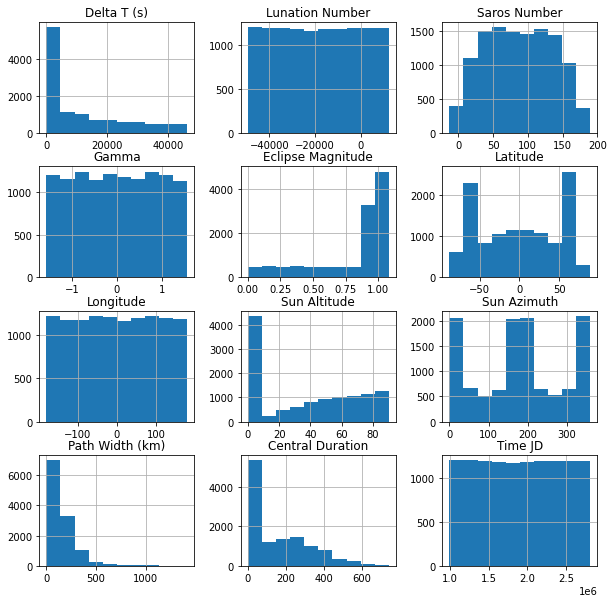

In [47]:
solar.hist(figsize=(10,10))

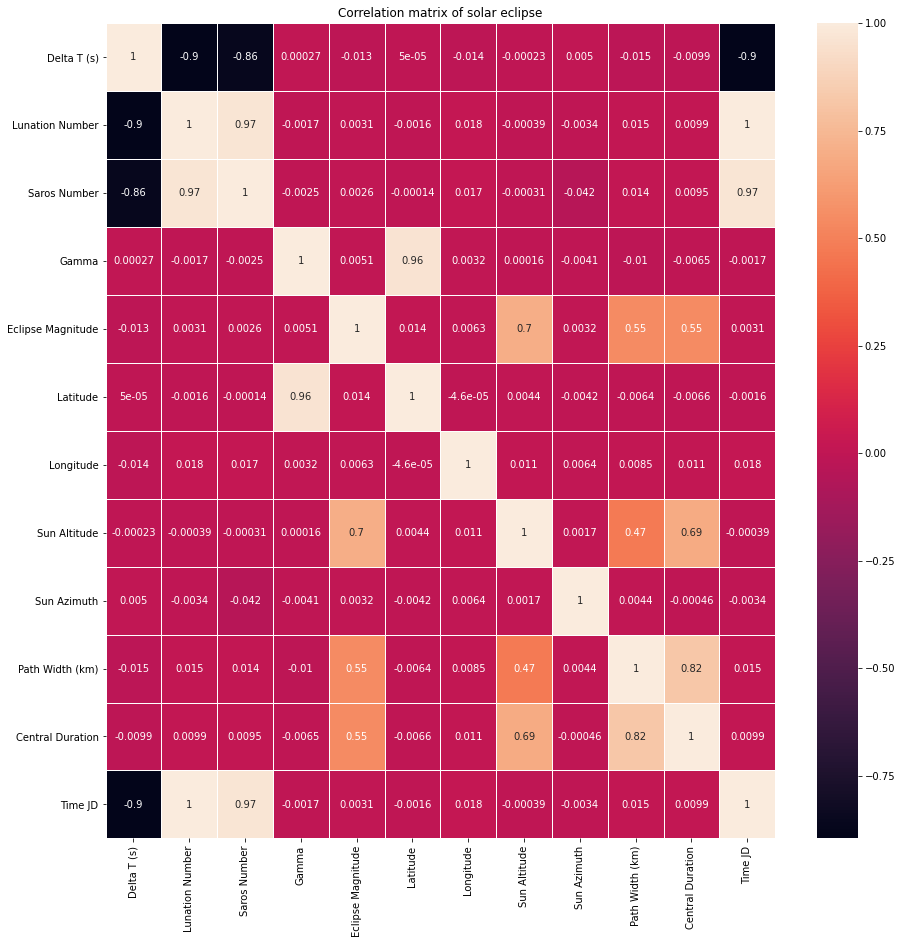

In [48]:
correlation_mat = new_solar.corr()

fig, ax = plt.subplots(figsize=(15,15))

sns.heatmap(correlation_mat, annot = True,  linewidths=.5, ax=ax)
plt.title("Correlation matrix of solar eclipse")

plt.show()

In [49]:
correlation_mat = new_solar.corr()
corr_pairs = correlation_mat.unstack()

sorted_pairs = corr_pairs.sort_values(kind="quicksort")

strong_pairs = sorted_pairs[abs(sorted_pairs) > 0.70]

#Realizamos Un listado las variables que tienen una correlacion mayor al 50 % 
for key in strong_pairs.keys():
    if (key[0] != key[1] ):
        print(key[0] + '\n' + key[1] + '\n' + str(strong_pairs.get(key)))
        print('-----------------')

Delta T (s)
Lunation Number
-0.8959094404304953
-----------------
Lunation Number
Delta T (s)
-0.8959094404304953
-----------------
Time JD
Delta T (s)
-0.8959094142154015
-----------------
Delta T (s)
Time JD
-0.8959094142154015
-----------------
Delta T (s)
Saros Number
-0.8618620631836241
-----------------
Saros Number
Delta T (s)
-0.8618620631836241
-----------------
Sun Altitude
Eclipse Magnitude
0.7027933025198325
-----------------
Eclipse Magnitude
Sun Altitude
0.7027933025198325
-----------------
Central Duration
Path Width (km)
0.8187423812366743
-----------------
Path Width (km)
Central Duration
0.8187423812366743
-----------------
Latitude
Gamma
0.956877073422518
-----------------
Gamma
Latitude
0.956877073422518
-----------------
Saros Number
Time JD
0.9654173096063818
-----------------
Time JD
Saros Number
0.9654173096063818
-----------------
Saros Number
Lunation Number
0.9654173260393896
-----------------
Lunation Number
Saros Number
0.9654173260393896
-----------------


## Diferencias de tiempos entre eclipses

Dados los periodos de orbitación de la tierra con respecto al Sol, es correcto pensar que bajo ciertas condiciones de eclipses anteriores se puedan dar repeticiones. En otras palabras, se puede pensar que el tiempo que debe transcurrir para el próximo eclipse, está dado por las condiciones de una cantidad **L** de eclipses anteriores. Por lo anterior, resulta útil calcular las diferencias entre los tiempos en calendario Juliano entre eclipses como una variable para el modelo a construir.

![image.png](./resources/timeline.jpg)

In [50]:
# Se calcula la diferencia entre los dias de un eclipse y del eclipse anterior
t_between = new_solar['Time JD'].diff().tolist()

# Se calcula la diferencia para el primer eclipse
t_between[0] = 0

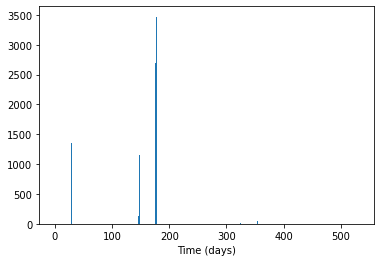

In [51]:
# Histograma de frecuencia para las diferencias
plt.hist(t_between,int(max(t_between))+1)
plt.xlabel('Time (days)')
plt.show()

In [52]:
# Asignando la diferencia de cada eclipse
new_solar['Diff'] = t_between

In [53]:
get_measures(new_solar, "Diff", print_results=True)
plot_graphs(new_solar, "Diff")

Valor mínimo: 0.0
Promedio: 157.1017412444116
Mediana: 157.1017412444116
Valor máximo: 531.4736574077979
Desviación estandar: 157.1017412444116
Asimetría: -0.43018937451300104
Curtosis: 4.5225867344274056


De los gráficos anteriores, se puede observar que gran parte de las diferencias de tiempo entre eclipses, se encuentran distribuidas en pocos intervalos, validando de una manera empírica la repetición de eclipses según la orbitación de la tierra al Sol. 

In [54]:
new_solar.head(5)

,Delta T (s),Lunation Number,Saros Number,Eclipse Type,Gamma,Eclipse Magnitude,Latitude,Longitude,Sun Altitude,Sun Azimuth,Path Width (km),Central Duration,Time JD,Diff
0,46438,-49456,5,T,-0.2701,1.0733,6.0,-33.3,74,344,247.0,397,991085.635313,0.000000
1,46426,-49450,10,A,-0.2317,0.9382,-32.9,10.8,76,21,236.0,404,991262.489850,176.854537
2,46415,-49444,15,T,0.4994,1.0284,46.2,83.4,60,151,111.0,135,991440.256435,177.766586
3,46403,-49438,20,A,-0.9045,0.9806,-67.8,-143.8,25,74,162.0,74,991616.747951,176.491516
4,46393,-49433,-13,P,-1.4670,0.1611,-60.6,-106.4,0,281,0.0,0,991765.055509,148.307558


## PCA (Principal Components Analysis)

Principal Component Analysis es un método estadístico que permite simplificar la complejidad de un espacio muestral, en otras palabras, permite representar un conjunto de datos con una cantidad de variables menor a la original (condensando). Cada nueva variable resultante de la reducción de dimensionalidad del conjunto de datos, recibe el nombre de componente principal.

**Consideraciones**
1. Las variables deben estar estandarizadas (media cero y desviación estandar uno).
2. No se deben tener en cuenta los outliers (valores atípicos).

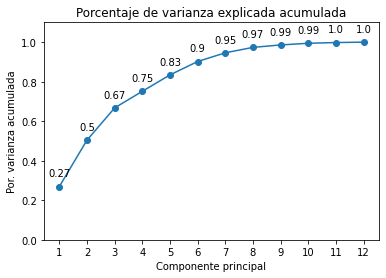

In [55]:
features = ['Delta T (s)', 'Lunation Number', 'Saros Number',
       'Gamma', 'Eclipse Magnitude', 'Latitude', 'Longitude', 'Sun Altitude',
       'Sun Azimuth', 'Path Width (km)', 'Central Duration','Diff']

# Extraemos las variables de interes
x = new_solar.loc[:, features].values

# Estandarizamos las variables de interes
x = StandardScaler().fit_transform(x)

# Definimos PCA igual al número de variables para el análisis del minimo
pca = PCA(n_components=12)

# Aplicacamos PCA
principalComponent = pca.fit(x)

# Obtenemos la varianza acumulada por componente principal
prop_varianza_acum = principalComponent.explained_variance_ratio_.cumsum()

# Definimos el gráfico para el análisis de la varianza acumulada
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(6, 4))

ax.plot(
    np.arange(len(features)) + 1,
    prop_varianza_acum,
    marker = 'o'
)

# Iteramos sobre cada una de las componentes y su varianza acumulada
for x, y in zip(np.arange(len(features)) + 1, prop_varianza_acum):
    label = round(y, 2)
    ax.annotate(
        label,
        (x,y),
        textcoords="offset points",
        xytext=(0,10),
        ha='center'
    )
    
ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(principalComponent.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Por. varianza acumulada');

Observado la gráfica de varianza explicada con respecto al número de componentes, queda claro que el cantidad mínima de variables a las que podemos reducir las mediciones de un eclipse son aproximadamente 7. Lo anterior implica que contamos con un problema de múlti-dimensional, dado que para cada variable de respuesta se cuenta con una matriz de entrada **(revisar algoritma para la transformación del dataset inicial en la siguiente sección)**.

## Modelo ML

A partir del conjunto de datos proporcionado por la NASA y transformado en este notebook, se desea construir un modelo de regresión que mediante una matriz de **L** observaciones de eclipses anteriores y **m** variables observadas por cada uno de los eclipses, esté en la capacidad de predecir la diferencia en calendario Juliano para el próximo eclipse Solar. A continuación se muestra un esquema sintetizando la información mecionada:

![image.png](./resources/split.jpg)

Recordado que las variables medidadas para un eclipse no se pueden reducir a menos de 7 componentes principales, se obta por aplicar un proceso de aplanado (flattening) en búsqueda de reducir la dimensión requerida por la mayoría de modelos de Machine Learning.

![image.png](./resources/flatting.png)


In [56]:
# Variable a estandarizar
variables = ['Delta T (s)', 'Lunation Number', 'Saros Number',
       'Gamma', 'Eclipse Magnitude', 'Latitude', 'Longitude', 'Sun Altitude',
       'Sun Azimuth', 'Path Width (km)', 'Central Duration','Diff']

# Estandarización y reasignación
new_solar[variables] = StandardScaler().fit_transform(new_solar[variables])

In [57]:
new_solar.head()

,Delta T (s),Lunation Number,Saros Number,Eclipse Type,Gamma,Eclipse Magnitude,Latitude,Longitude,Sun Altitude,Sun Azimuth,Path Width (km),Central Duration,Time JD,Diff
0,2.534788,-1.729678,-1.707458,T,-0.296320,0.869876,0.114565,-0.323594,1.143378,1.472738,0.975246,1.537674,991085.635313,-2.866038
1,2.533902,-1.729343,-1.604138,A,-0.253732,0.424189,-0.655884,0.100557,1.204694,-1.434004,0.891561,1.581108,991262.489850,0.360354
2,2.533090,-1.729008,-1.500817,T,0.557095,0.721753,0.910761,0.798819,0.714168,-0.264108,-0.059410,-0.087996,991440.256435,0.376993
3,2.532204,-1.728673,-1.397497,A,-0.999902,0.564064,-1.347110,-1.386376,-0.358858,-0.957046,0.328586,-0.466492,991616.747951,0.353731
4,2.531466,-1.728394,-2.079412,P,-1.623743,-2.139415,-1.204507,-1.026665,-1.125305,0.905788,-0.903873,-0.925651,991765.055509,-0.160434


In [58]:
# Cantidad de eclipses requeridos para predicir el próximo eclipse
L = 70

X = []
y = []

variables_entrada = ['Lunation Number', 'Saros Number',
       'Eclipse Magnitude', 'Latitude', 'Longitude', 'Sun Altitude',
       'Sun Azimuth', 'Path Width (km)', 'Central Duration','Diff']

# Selección de los L eclipses anteriores para una variable de respuesta
for j in range(len(new_solar)-L):
    X.append(new_solar[j:j+L][variables_entrada].to_numpy().flatten())
    y.append(int(new_solar.iloc[j+L]['Diff']))

#Transformación de las variables de entrada y respuesta a arreglos de numpy
X = np.array(X)
y = np.array(y)

print('Dimensión variables de entrada')
print(X.shape)

print('Dimensión variables de respuesta')
print(y.shape)

Dimensión variables de entrada
(11553, 700)
Dimensión variables de respuesta
(11553,)


### Train, test and validation split

Con el proposito de organizar el flujo para el proceso de entrenamiento y validación del modelo, se opta por realizar una separación del conjunto de datos siguiendo el método train, test y validation con proporciones 60%, 20% y 20% respectivamente. A continuación se tiene un gráfico con un resumen del proceso:

![image.png](./resources/train_test_validation.png)

In [59]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)

X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

## Regresión lineal

La regresión lineal es un método estadístico que trata de modelar la relación entre una variable continua y una o más variables independientes mediante el ajuste de una ecuación lineal. Para dar un definición más formal del método, tenemos que:

![image.png](./resources/regresionLineal.png)

### Métricas de desempeño

\\(R^2:\\) El R cuadrado es una métrica estadística que se utiliza en modelos de regresión para evaluar que tan bien se están prediciendo los valores futuros. En otras palabras, es el porcentaje de variación de la variable de respuesta \\(y\\) que es explicado por las variables predictoras \\(X\\). Mientras el valor se encuentre más cerca de 100% podemos decir que mejor desempeño tiene el modelo.

\\(MSE:\\) El error cuadrático medio es el promedio de la diferencia al cuadrado entre el valor objetivo y el valor predicho por el modelo de regresión. El cálculo es capaz de penalizar pequeños errores.

In [60]:
lr_multiple = linear_model.LinearRegression()
lr_multiple.fit(X_train, y_train)

LinearRegression()

In [61]:
y_train_pred = lr_multiple.predict(X_train)
print('TRAIN')
metrics(y_train, y_train_pred)

TRAIN
Métricas de desempeño
R cuadrado 0.6020708681389786
MSE 0.26665912240119444


In [62]:
y_test_pred = lr_multiple.predict(X_test)
print('TEST')
metrics(y_test, y_test_pred)

TEST
Métricas de desempeño
R cuadrado 0.5621718244208674
MSE 0.28627244206548846


## SVR (Support Vector Regression)

La regresión de vectores de soporte es un tipo de máquina que admite la regresión lineal y no lineal, para realizar el análisis de regresión los datos deben de contener números reales continuos. Para ajustar este tipo de datos, el modelo SVR aproxima los mejores valores con un margen, considerando la complejidad del modelo y la tasa de error. la misión es encajar tantas instancias como sea posible entre líneas. El trabajo del SVM es aproximar la función que usamos para generar el conjunto de entrenamiento para reforzar parte de la información que ya hemos discutido en un problema de clasificación.

In [63]:
svr = SVR().fit(X_train, y_train)

In [64]:
y_train_pred = svr.predict(X_train)
print('TRAIN')
metrics(y_train, y_train_pred)

TRAIN
Métricas de desempeño
R cuadrado 0.6749092005337891
MSE 0.2178489091284697


In [65]:
y_test_pred = svr.predict(X_test)
print('TEST')
metrics(y_test, y_test_pred)

TEST
Métricas de desempeño
R cuadrado 0.44530987829955937
MSE 0.36268222235525854


## Análisis de resultados y conclusiones

1. De acuerdo con las métricas de desempeño utilizadas, se evidencia claramente que la regresión lineal tiene un mejor resultado para la predicción de valores desconocidos por el modelo R cuadrado LR > R cuadrado SVR (kernel por defecto).
2. Comparando los resultados para le modelo de SVR con kernel por defecto, se evidencia un sobre ajuste del modelo sobre los datos de entrenamiento. R cuadrado train >> R cuadrado test.
3. Los modelos obtenidos son el mejor resultado del ajuste de las variables de entrada (se removieron variables con alta correlación) y el ajuste del hiperpaŕametro **L**
4. Asumir un proceso de **flattening** a modo de reducción de dimensionalidad, pudo afectar los resultados de ambos modelos de predicción. Como trabajo futuro puede ser recomendable un extractor de características diferente a PCA, como proceso de entrada para los modelos de regresión.
5. Se analizó reducir la dimensionalidad utilizando una CNN, pero esta metodología no se aplica dado que para una matriz de eclipses no existe una relación espacial entre los elementos (como si lo existe en las imágenes, etc.)
6. Aunque se puedo analizar el problema inicial como un modelo de regresión, gracias a la transformación de la fecha a un número en calendario Juliano. Es recomendable analizar el problema como una serie de tiempo.